### Instalando Bibliotecas

In [1]:
%pip install pandas
%pip install matplotlib
%pip install scikit-learn
%pip install numpy
%pip install seaborn
%pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


### Importando Bibliotecas Gerais

In [129]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Utilizando Dado de Classificação de Linhas de Trasmissão

- https://www.kaggle.com/datasets/esathyaprakash/electrical-fault-detection-and-classification

In [ ]:
data = pd.read_csv('./data/kaggle/classData.csv')
data.describe()

### Transformando Colunas 'G'/'C'/'B'/'A' em classes 0,1,2,3,4,5 na coluna 'faultType'

In [132]:

df=data.copy()
df['faultType'] = df['G'].astype(str) + df['C'].astype(str) + df['B'].astype(str) + df['A'].astype(str)
# Define a dictionary for replacement values
replacement_dict = {
    '0000': 0, #NoFault #2365
    '1001': 1, #Fault AG #1129
    '0110': 2, #Fault CB #1004
    '1011': 3, #Fault ABG #1134
    '0111': 4, #Fault CBA #1096
    '1111': 5  #Fault ABCG #1133
}

# Replace values in the 'fault_type' column based on the dictionary
df['faultType'] = df['faultType'].replace(replacement_dict)
df['faultType'] = df['faultType'].astype(int)
#df = if '0000'=0 if '1001'= 1 if '0011' = 2 if '1011' = 3 if "0111"= 4 if = '1111'=5


C:\Users\b.machado.de.souza\AppData\Local\Temp\ipykernel_20708\705956356.py:15: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['faultType'] = df['faultType'].replace(replacement_dict)


### Eliminando Colunas não utilizadas

In [ ]:
data = data.drop(['G','A','B','C'],axis=1)

### Criando dataset de atributos(X) e de saídas(y)

In [133]:
X = data.copy()
y = df['faultType']

0       1
1       1
2       1
3       1
4       1
       ..
7856    0
7857    0
7858    0
7859    0
7860    0
Name: faultType, Length: 7861, dtype: int32

### Balanceado os dados

In [134]:
from imblearn.over_sampling import RandomOverSampler

oversampler = RandomOverSampler(sampling_strategy='auto')
X_resampled, y_resampled = oversampler.fit_resample(X, y)

In [127]:
X_resampled.describe()
y_resampled.describe()

2365

### Dividindo os dados em dados de treinamento e validação

In [135]:
# # Import necessary libraries
from sklearn.model_selection import train_test_split

X = data.copy()
y = df['faultType']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3)

### Modelo DT


In [139]:
best_params={
    'criterion': 'entropy',
    'min_samples_leaf': 2,
    'min_samples_split': 2,
    'splitter': 'best'
}

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_clf = DecisionTreeClassifier(**best_params)
dt_clf = dt_clf.fit(X_train, y_train)
predictions = dt_clf.predict(X_test)
precdict = dt_clf.predict_proba(X_test)


In [144]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, predictions)

0.9532534648813719

In [ ]:
from sklearn.metrics import precision_score
precision_score(y_test, predictions, average='macro')

In [ ]:
from sklearn.metrics import recall_score
recall_score(y_test, predictions, average='macro')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions,digits=4, target_names=['0','1','2','3','4','5']))

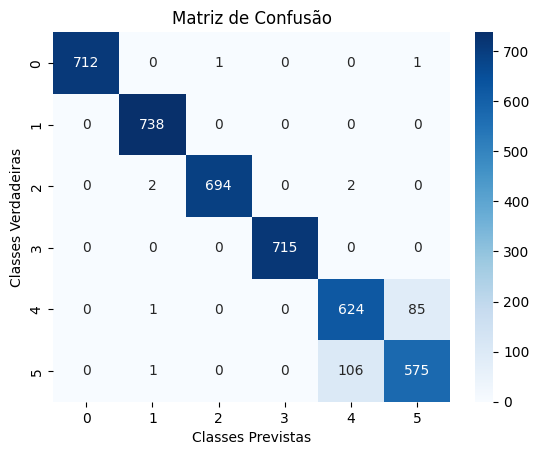

In [145]:
from sklearn.metrics import confusion_matrix
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()

In [45]:
# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({'Feature':  X.columns, 'Importance': dt_clf.feature_importances_})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False, ignore_index=True)

feature_importance_df.head(10).plot(kind='bar',x='Feature',y='Importance')

,Feature,Importance
0,Ic,0.355310
1,Ib,0.245030
2,Ia,0.213119
3,Va,0.101150
4,Vb,0.049312
5,Vc,0.036079


In [25]:
from sklearn import tree
from matplotlib import pyplot as plt

fig = plt.figure(figsize=(200,200
                          ))
_ = tree.plot_tree(dt_clf, 
                   feature_names=X.columns,  
                   class_names={0:'No Fault', 1:'LG',2:'LL',3:'LLG',4:'LLL',5:'LLLG'},
                   filled=True,
                  fontsize=12)

### Modelo SVM

In [ ]:
best_params= {'C': 30000, 'gamma': 'scale', 'kernel': 'rbf'}

In [ ]:
from sklearn import svm
svm_clf = svm.SVC(**best_params)
svm_clf = svm_clf.fit(X_train, y_train)
predictions = svm_clf.predict(X_test)

In [ ]:
accuracy_score(y_test, predictions)
precision_score(y_test, predictions, average='macro')
recall_score(y_test, predictions, average='macro')
print(classification_report(y_test, predictions,digits=4, target_names=['0', '1','2','3','4','5']))

In [ ]:
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()


### Modelo RF

In [ ]:
best_params = {   
 'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 11,
 'min_samples_split': 2,
 'n_estimators': 100
 }

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(**best_params)
rf_clf.fit(X_train, y_train)
predictions = rf_clf.predict(X_test)

In [ ]:
accuracy_score(y_test, predictions)
precision_score(y_test, predictions, average='macro')
recall_score(y_test, predictions, average='macro')
print(classification_report(y_test, predictions,digits=4, target_names=['0', '1','2','3','4','5']))

In [ ]:
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()


In [ ]:
# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({'Feature':  X.columns, 'Importance': rf_clf.feature_importances_})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False, ignore_index=True)

feature_importance_df.head(10).plot(kind='bar',x='Feature',y='Importance')

### Modelo KNN

In [ ]:
best_params = {
    'metric': 'euclidean', 
    'n_neighbors': 1, 
    'p': 2, 
    'weights': 'distance'
}

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_clf = KNeighborsClassifier(**best_params)

knn_clf.fit(X_train, y_train)

In [ ]:
accuracy_score(y_test, predictions)
precision_score(y_test, predictions, average='macro')
recall_score(y_test, predictions, average='macro')
print(classification_report(y_test, predictions,digits=4, target_names=['0', '1','2','3','4','5']))

In [ ]:
# Assuming y_test and predictions are your actual and predicted labels
cm = confusion_matrix(y_test, predictions, labels=[0, 1, 2, 3, 4, 5])

# Plotting the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2, 3, 4, 5], yticklabels=[0, 1, 2, 3, 4, 5])
plt.title("Matriz de Confusão")
plt.xlabel("Classes Previstas")
plt.ylabel("Classes Verdadeiras")
plt.show()